# Simple Univariate Linear Regression - Predicting Maximum temperature given the minimum temperature

### import libraries

In [1]:
import pandas as pd
import numpy as np

from sklearn import linear_model, model_selection
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="darkgrid")
%config InlineBackend.figure_formats = ['svg']
import warnings
warnings.filterwarnings('ignore')

### load and clean the dataset

In [2]:
data = pd.read_csv('weather_data.csv', low_memory=False)
data.head()

,STA,Date,Precip,WindGustSpd,MaxTemp,MinTemp,MeanTemp,Snowfall,PoorWeather,YR,...,FB,FTI,ITH,PGT,TSHDSBRSGF,SD3,RHX,RHN,RVG,WTE
0,10001,1942-7-1,1.016,NaN,25.555556,22.222222,23.888889,0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10001,1942-7-2,0,NaN,28.888889,21.666667,25.555556,0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10001,1942-7-3,2.54,NaN,26.111111,22.222222,24.444444,0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10001,1942-7-4,2.54,NaN,26.666667,22.222222,24.444444,0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10001,1942-7-5,0,NaN,26.666667,21.666667,24.444444,0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# select variables needed for modelling
columns_needed = ['Date', 'MinTemp', 'MaxTemp', 'YR', 'MO', 'DA', 'Precip']
weather_df = data[[column for column in data.columns if column in columns_needed]]

In [4]:
weather_df.head()

,Date,Precip,MaxTemp,MinTemp,YR,MO,DA
0,1942-7-1,1.016,25.555556,22.222222,42,7,1
1,1942-7-2,0,28.888889,21.666667,42,7,2
2,1942-7-3,2.54,26.111111,22.222222,42,7,3
3,1942-7-4,2.54,26.666667,22.222222,42,7,4
4,1942-7-5,0,26.666667,21.666667,42,7,5


In [5]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119040 entries, 0 to 119039
Data columns (total 7 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   Date     119040 non-null  object 
 1   Precip   119040 non-null  object 
 2   MaxTemp  119040 non-null  float64
 3   MinTemp  119040 non-null  float64
 4   YR       119040 non-null  int64  
 5   MO       119040 non-null  int64  
 6   DA       119040 non-null  int64  
dtypes: float64(2), int64(3), object(2)
memory usage: 6.4+ MB


In [6]:
# change respective columns to appropriate data type
weather_df.Date = pd.to_datetime(weather_df.Date)

# the Precip column contains values T which denotesdenotes an amount of precipitation, 
# such as rain or snow, that is greater than zero (0.005), but is too small to be measured by standard unit or measurement
# map T to zero: which means no precipitation
weather_df.Precip = weather_df.Precip.replace({'T' : 0}).astype('float64')

In [7]:
weather_df.isnull().sum()

Date       0
Precip     0
MaxTemp    0
MinTemp    0
YR         0
MO         0
DA         0
dtype: int64

In [8]:
weather_df.dtypes

Date       datetime64[ns]
Precip            float64
MaxTemp           float64
MinTemp           float64
YR                  int64
MO                  int64
DA                  int64
dtype: object

In [9]:
weather_df.corr()

,Precip,MaxTemp,MinTemp,YR,MO,DA
Precip,1.000000,0.004457,0.088455,0.008951,0.037802,0.000595
MaxTemp,0.004457,1.000000,0.878384,0.039585,0.031346,-0.005130
MinTemp,0.088455,0.878384,1.000000,-0.020733,0.069078,-0.002576
YR,0.008951,0.039585,-0.020733,1.000000,-0.144360,-0.011196
MO,0.037802,0.031346,0.069078,-0.144360,1.000000,0.006563
DA,0.000595,-0.005130,-0.002576,-0.011196,0.006563,1.000000


In [10]:
print(f'There are {weather_df.shape} observations from 19{weather_df.YR.min()} to 19{weather_df.YR.max()}')

There are (119040, 7) observations from 1940 to 1945


### Exploring the Dataset

<AxesSubplot:>

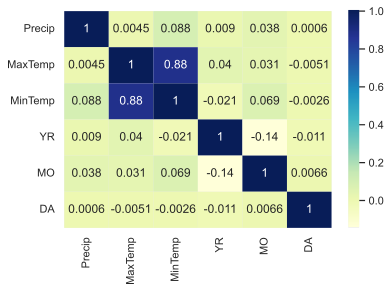

In [11]:
#show correlation betw variables
sns.heatmap(data=weather_df.corr(), cmap="YlGnBu", annot=True)

##### 

In [12]:
#scatter plot
colors = []
for i in weather_df['Precip']:
    if i == 0.00:
        colors.append('red')
    else:
        colors.append('blue')

In [13]:
plt.figure(figsize=(10, 5))
handles = [weather_df[weather_df.Precip == 0], weather_df[weather_df.Precip > 0]]
for i in handles:
    _ = plt.scatter(x=i['MinTemp'], y=i['MaxTemp'], alpha = 0.3, s = 1)
plt.legend(['Precipition > 0', 'Precipitation = 0'])
plt.ylabel('Maximum temperature')
plt.xlabel('Minimum temperature')

Text(0.5, 0, 'Minimum temperature')

In [14]:
#remove outliers from the dataset
outliersX = weather_df[ (weather_df['MinTemp'] > 8) &
                      (weather_df['MinTemp'] < 30) & 
                      (weather_df['MaxTemp'] < -10)]

outlierY = weather_df[ (weather_df['MinTemp'] > -20) &
                      (weather_df['MinTemp'] < -10) & 
                      (weather_df['MaxTemp'] > 18)]

weather_df = pd.concat([weather_df, outliersX, outlierY]).drop_duplicates(keep=False)

In [15]:
#select rows where there are zero Precipitations
weather_zero_precip = weather_df[weather_df['Precip'] == 0]

#select rows where there are precipitaion > 0
weather_precip = weather_df[weather_df['Precip'] > 0]

print(f'There are {weather_zero_precip.shape} rows with zero precipitation')
print(f'There are {weather_precip.shape} rows with precipitation greater than zero')

There are (72479, 7) rows with zero precipitation
There are (36804, 7) rows with precipitation greater than zero


Text(0.5, 0.04, 'Minimum temperature')

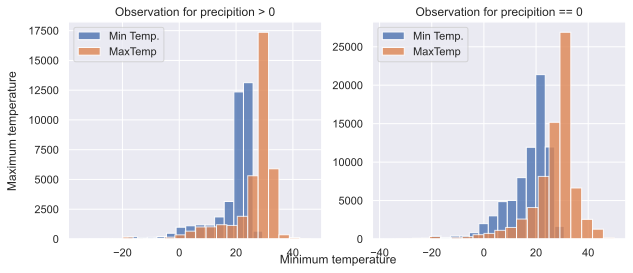

In [16]:
#create two subplots
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

first1 = ax[0].hist(weather_precip['MinTemp'], bins=20, alpha=0.8)
first2 =  ax[0].hist(weather_precip['MaxTemp'], bins=20, alpha=0.8)
ax[0].title.set_text('Observation for precipition > 0')
ax[0].legend(['Min Temp.', 'MaxTemp'])

second1 = ax[1].hist(weather_zero_precip['MinTemp'], bins=20, alpha=0.8)
second2 = ax[1].hist(weather_zero_precip['MaxTemp'], bins=20, alpha=0.8)
ax[1].title.set_text('Observation for precipition == 0')
ax[1].legend(['Min Temp.', 'MaxTemp'])

fig.text(s = 'Maximum temperature', va = 'center', x = 0.04, y = 0.5, rotation='vertical')
fig.text(s = 'Minimum temperature', ha = 'center', y = 0.04, x = 0.5)



# #show the distribution of the both Min and Max temperatures


In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].scatter(weather_precip['MinTemp'], y= weather_precip['MaxTemp'], s = 1, alpha=0.2)
ax[1].scatter(weather_zero_precip['MinTemp'], y= weather_zero_precip['MaxTemp'], s = 1, alpha=0.2)

fig.text(va ='center', s = 'Maximum Temperature', x=0.04, y=0.5, rotation = 'vertical')
fig.text(ha ='center', s = 'Minimum Temperature', x = 0.5, y=0.04)
ax[0].title.set_text('Observation for precipition > 0')
ax[1].title.set_text('Observation for precipition = 0')

### Select feature and target variables

In [ ]:
#select minimum temp.
X1 = weather_precip.MinTemp.values
X2 =  weather_zero_precip.MinTemp.values
#select maximum temp as target
y1 = weather_precip.MaxTemp.values
y2 = weather_zero_precip.MaxTemp.values

In [ ]:
#change the feature variable to 2D array
X1, X2 = X1.reshape(-1,1), X2.reshape(-1,1)

print(f'The shape of the feature variable are {X1.shape} for zero precip and {X2.shape} for precip greater than zero')
print(f'The shape of the target variables are {y1.shape} for zero precip and {y2.shape} for precip greater than zero')

### Build the model

In [ ]:
# split weather_precip into train and test sets
X1_train, X1_test, y1_train, y1_test = model_selection.train_test_split(X1, y1, test_size=0.3, random_state=43)

#split weather_zero_precip into train and test sets
X2_train, X2_test, y2_train, y2_test = model_selection.train_test_split(X2, y2, test_size=0.3, random_state=42)


In [ ]:
#create an instance of Linear regression
model1 = linear_model.LinearRegression()
model2 = linear_model.LinearRegression()

#fit model to train set
model1.fit(X1_train, y1_train)
model2.fit(X2_train, y2_train)

#predict using test set
y1_pred = model1.predict(X1_test)
y2_pred = model2.predict(X2_test)

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,5), sharey=True, sharex=True)
ax[0].scatter(x = X1_test, y = y1_test, s =1)
ax[0].plot(X1_test, y1_pred, color = 'red')
ax[1].scatter(x = X2_test, y = y2_test, s = 1)
ax[1].plot(X2_test, y2_pred, color = 'red')

ax[0].title.set_text('Model for precipition > 0')
ax[1].title.set_text('Model for precipition == 0')


fig.text(0.5, 0.04, 'Minimun Temperature', ha='center')
fig.text(0.04, 0.5, 'Maximum Temperature', va='center', rotation='vertical')
# plt.show()

### Model Evaluation

In [ ]:
mse = np.sqrt(mean_squared_error(y1_test, y1_pred))
print(f'Model_1 MSE: {round(mse, 2)} ({mse/np.mean(y1_pred)*100:3.3}%)')
print(f'Model_1 Coefficient of determination: {model1.score(X1_test, y1_test):3.3}')

In [ ]:
#predict the maximum temperature of a day after observing the minimum temperature to be 27
print(f'When Minimum temperature is 27, Maximum temperature is expected to be {model1.predict([[27.0]])[0]:3.3}')

# Synopsis
Two simple Univariate linear regression was built. One for weather observations where there were zero precipitation and another where precipitation was greater than zero. The latter performed much better in than the former with an RScore of 0.88 and RMSE of 2.76

Note that a better model can be achieved by adding more predictor variables like Day of the year, month, and Precipitation value; but for the sake of learning I have limited this to one predictor variable and one response variable